In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing the libraries

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# Loading the dataset


In [3]:
df = pd.read_csv("/content/drive/MyDrive/data.xlsx - Sheet1.csv")

In [4]:
# Head of the dataset
df.head(5)

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [5]:
# shape of the dataset
df.shape

(3998, 39)

In [6]:
# info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

In [7]:
# Description of the dataset
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400





# Univariate Analysis


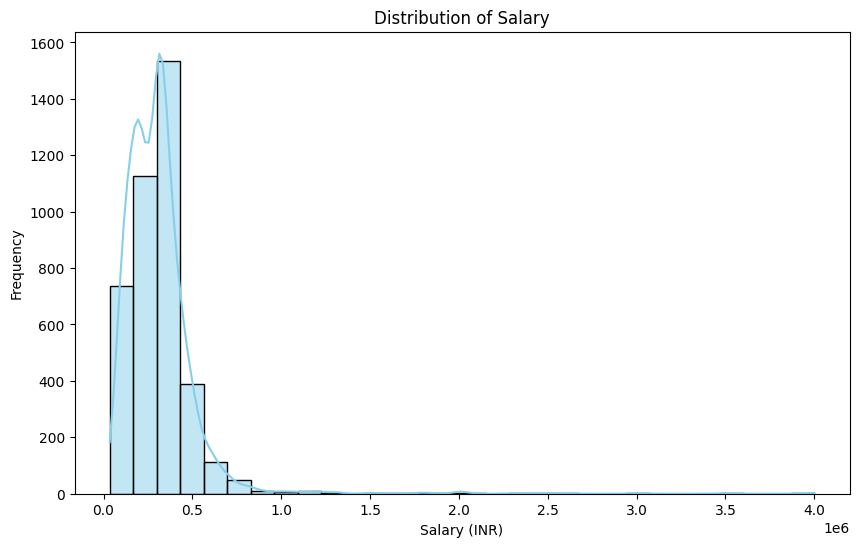

In [10]:
# PDF and Histogram for Salary

plt.figure(figsize=(10, 6))
sns.histplot(df['Salary'], kde=True, bins=30, color='skyblue')
plt.title('Distribution of Salary')
plt.xlabel('Salary (INR)')
plt.ylabel('Frequency')
plt.show()

***Observing the histogram allows for the identification of the central tendency, spread, and shape of the salary distribution. Additionally, any skewness or presence of outliers in the salary distribution can be discerned from this visualization.***

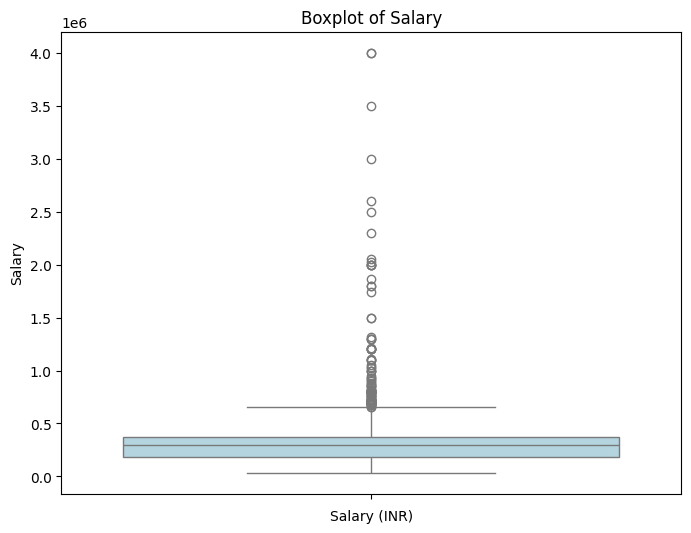

In [9]:
# Boxplot for Salary

plt.figure(figsize=(8, 6))
sns.boxplot(df['Salary'], color='lightblue')
plt.title('Boxplot of Salary')
plt.xlabel('Salary (INR)')
plt.show()

<ipython-input-12-a1bd21ef64f6>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(df['Gender'], palette='pastel')


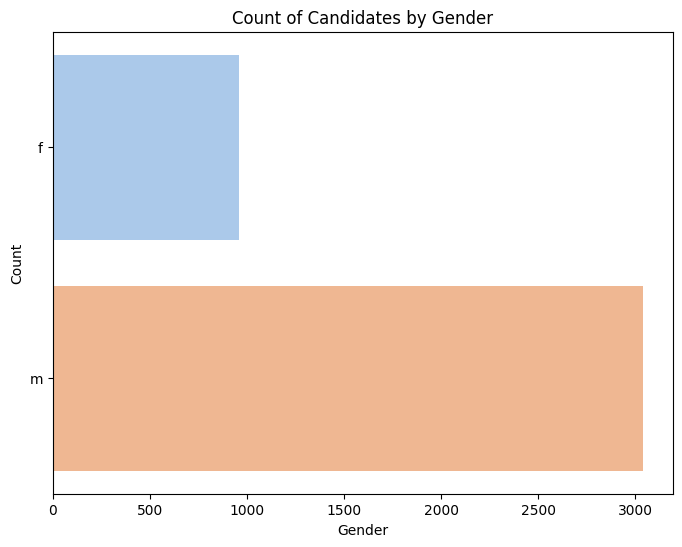

In [12]:
# Countplot for Gender

plt.figure(figsize=(8, 6))
sns.countplot(df['Gender'], palette='pastel')
plt.title('Count of Candidates by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()


<ipython-input-13-c168348af195>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(df['CollegeTier'], palette='muted')


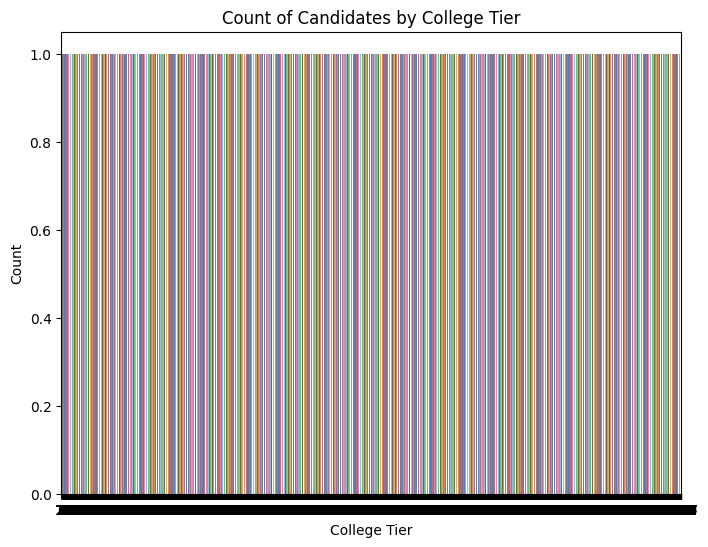

In [13]:
# Countplot for CollegeTier

plt.figure(figsize=(8, 6))
sns.countplot(df['CollegeTier'], palette='muted')
plt.title('Count of Candidates by College Tier')
plt.xlabel('College Tier')
plt.ylabel('Count')
plt.show()


<ipython-input-14-4fbabb4c5f02>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df['Specialization'], palette='dark')


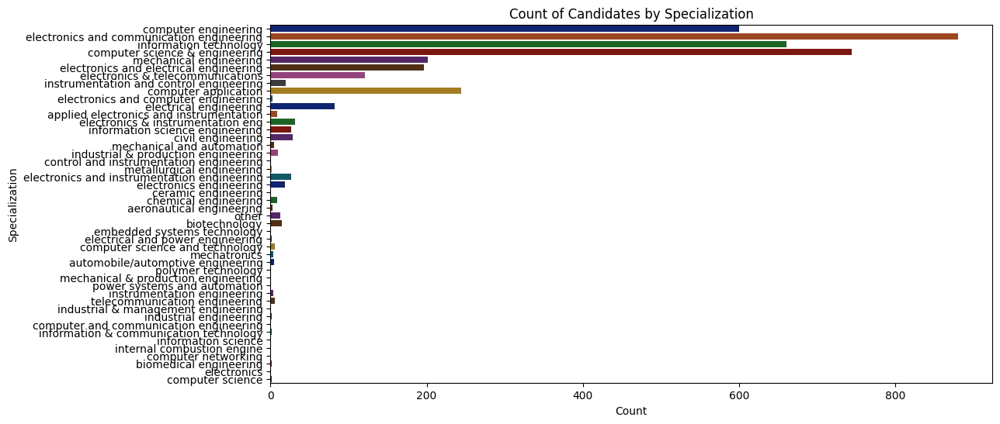

In [14]:
# Countplot for Specialization

plt.figure(figsize=(12, 6))
sns.countplot(y=df['Specialization'], palette='dark')
plt.title('Count of Candidates by Specialization')
plt.xlabel('Count')
plt.ylabel('Specialization')
plt.show()


<ipython-input-15-b3e3ca6ce581>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(df['GraduationYear'], palette='bright')


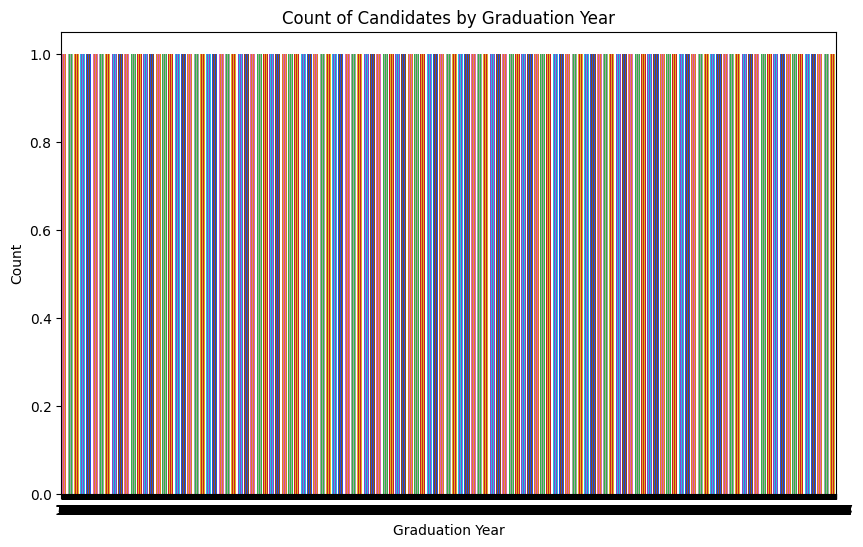

In [15]:
# Countplot for GraduationYear

plt.figure(figsize=(10, 6))
sns.countplot(df['GraduationYear'], palette='bright')
plt.title('Count of Candidates by Graduation Year')
plt.xlabel('Graduation Year')
plt.ylabel('Count')
plt.show()


In [ ]:
# Find outliers using the IQR method for each numerical column
def find_outliers_iqr(df):
    outliers = {}
    for column in df.select_dtypes(include=['int64', 'float64']):
        Q1, Q3 = df[column].quantile([0.25, 0.75])
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers[column] = df[(df[column] < lower_bound) | (df[column] > upper_bound)][column]
    return outliers

# Call the function to find outliers
outliers = find_outliers_iqr(df)

# Print outliers for each numerical column
for column, values in outliers.items():
    print(f"Outliers in :'{column}' column:  ")
    print(values)
    print()



***The presence of outliers highlights the critical need for thorough data exploration, analytical scrutiny, and informed decision-making to ensure the reliability and resilience of subsequent analyses or modeling endeavors.***





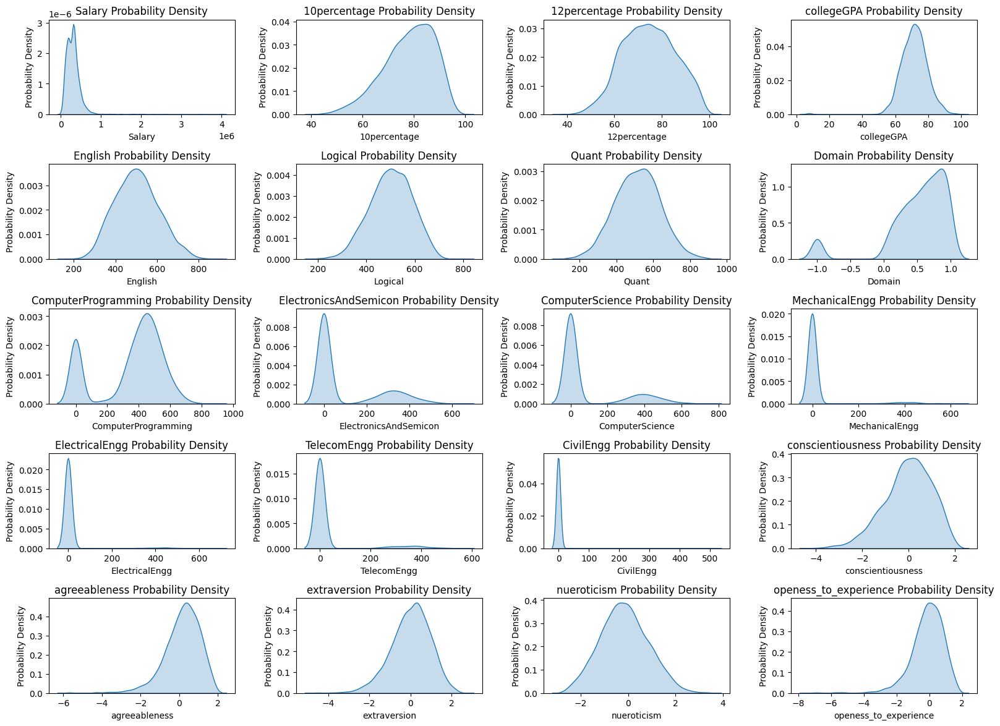

In [26]:
# Probability
num_cols = ['Salary', '10percentage', '12percentage', 'collegeGPA', 'English', 'Logical', 'Quant',
                     'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
                     'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness',
                     'extraversion', 'nueroticism', 'openess_to_experience']



# Plot KDE plots for numerical columns

plt.figure(figsize=(16, 12))
for i, col in enumerate(num_cols, 1):
    plt.subplot(5, 4, i)
    sns.kdeplot(data=df[col], fill=True)
    plt.title(f'{col} Probability Density')
    plt.xlabel(col)
    plt.ylabel('Probability Density')

plt.tight_layout()
plt.show()

***The plots illustrate the probability density distribution of different numerical attributes. Each attribute showcases a distinctive pattern, reflecting variations in data concentration and variability. Skewness and the presence of multimodal distributions are discernible characteristics within the visualizations.***

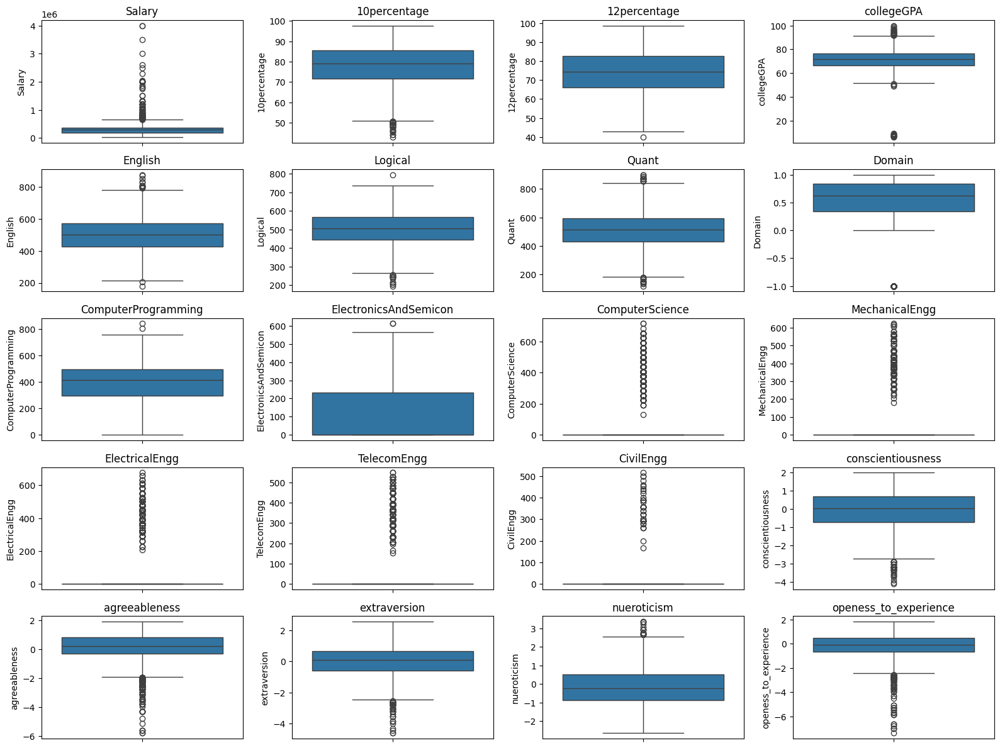

In [19]:
# Define numerical columns

num_columns = ['Salary', '10percentage', '12percentage', 'collegeGPA', 'English', 'Logical', 'Quant',
                     'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
                     'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness', 'agreeableness',
                     'extraversion', 'nueroticism', 'openess_to_experience']



# Visualize outliers using box plots

plt.figure(figsize=(16, 12))
for i, col in enumerate(num_columns, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(df[col])
    plt.title(col)
plt.tight_layout()
plt.show()


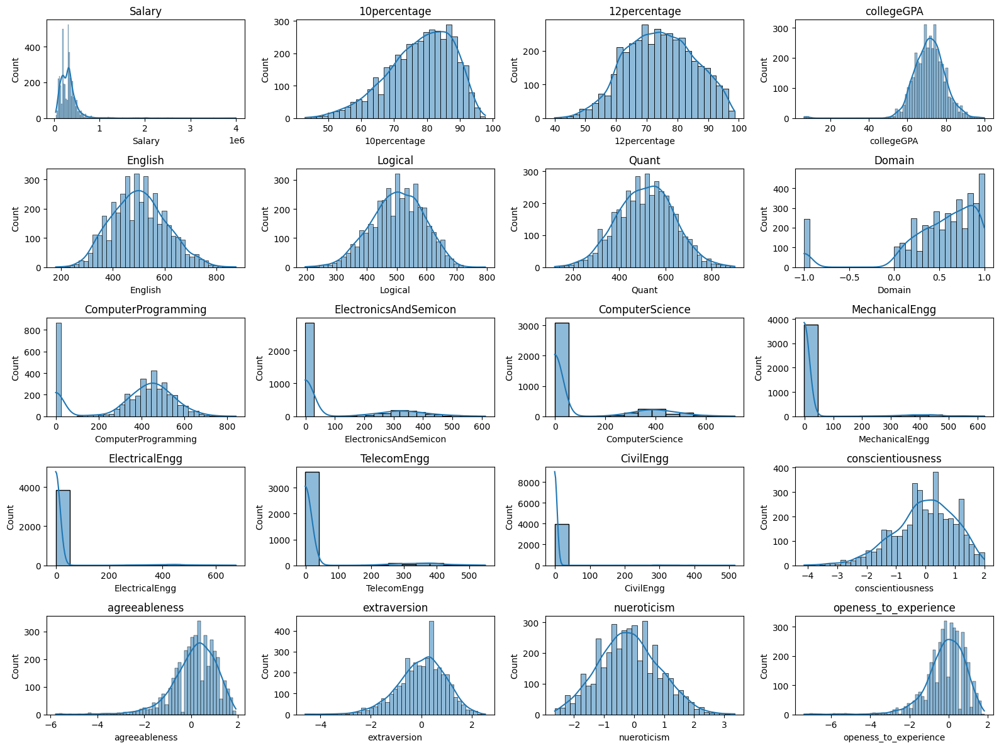

In [22]:
# Visualize probability and frequency distribution using histograms


plt.figure(figsize=(16, 12))
for i, col in enumerate(num_columns, 1):
    plt.subplot(5, 4, i)
    sns.histplot(df[col], kde=True)
    plt.title(col)
plt.tight_layout()
plt.show()


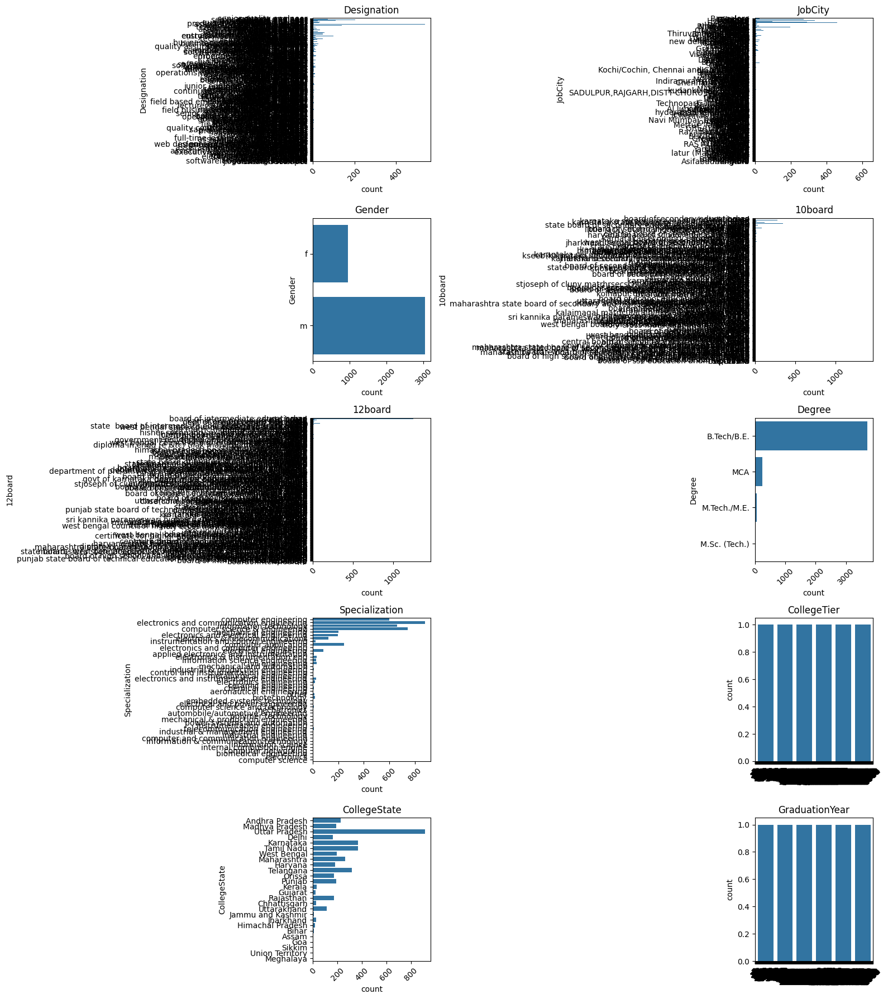

In [23]:
# categorical columns

categorical_columns = ['Designation', 'JobCity', 'Gender', '10board', '12board', 'Degree', 'Specialization',
                       'CollegeTier', 'CollegeState', 'GraduationYear']

# Visualizing frequency distribution of each categorical column using count plots

plt.figure(figsize=(16, 18))
for i, col in enumerate(categorical_columns, 1):
    plt.subplot(5, 2, i)
    sns.countplot(df[col])
    plt.title(col)
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



# Bivariate Analysis

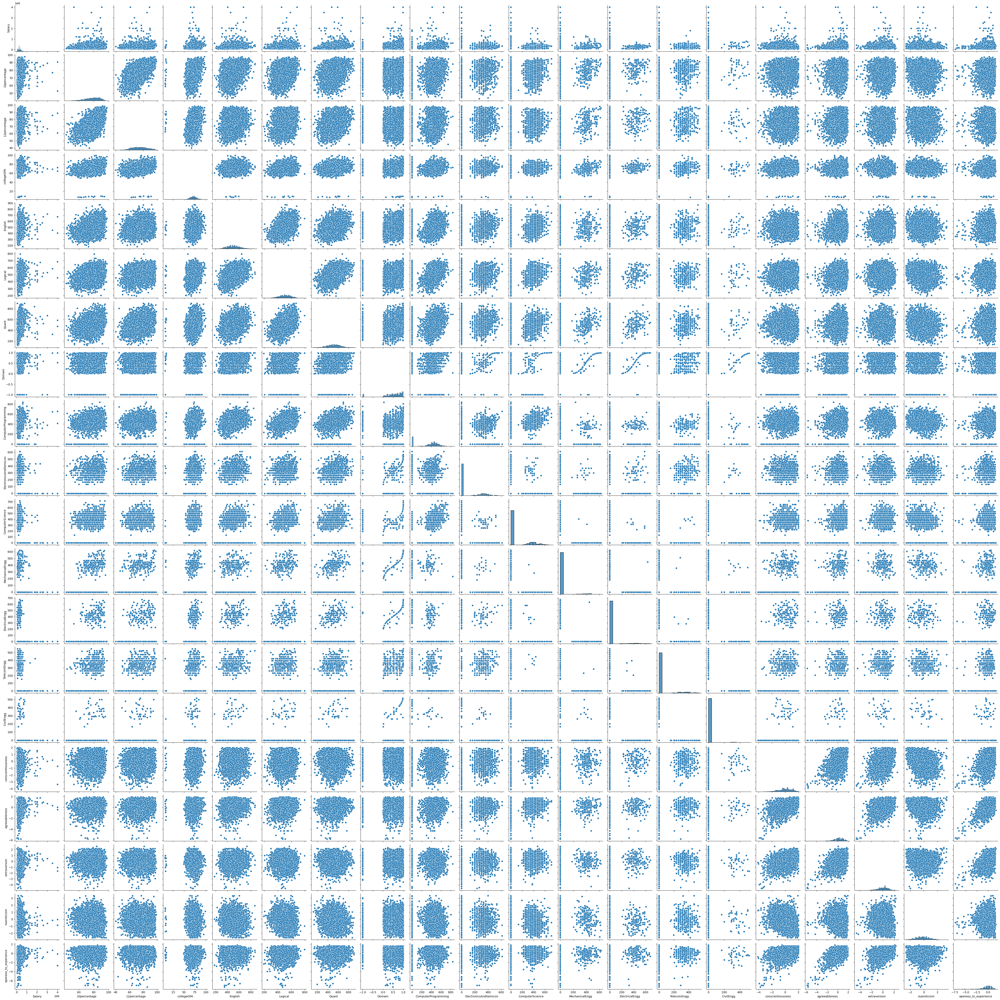

In [27]:
sns.pairplot(df[num_columns])
plt.show()

<Figure size 1000x800 with 0 Axes>

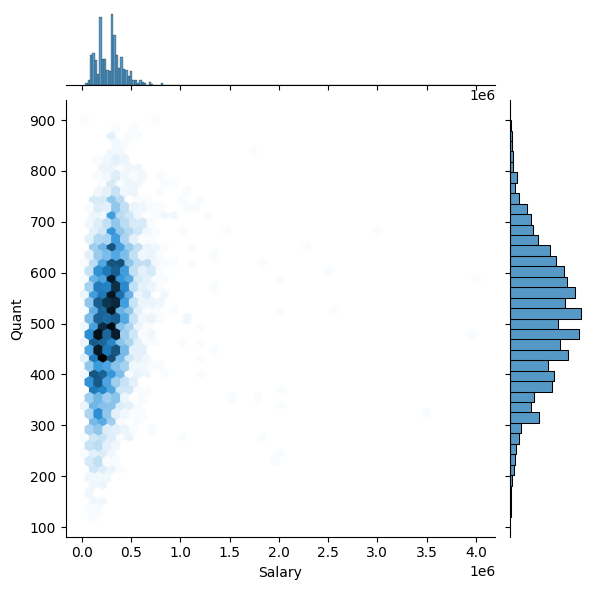

In [28]:
# Hexbin plots for large datasets

plt.figure(figsize=(10, 8))
sns.jointplot(x='Salary', y='Quant', data=df, kind='hex')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 31.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 66.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 54.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3398: UserWarning: 78.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


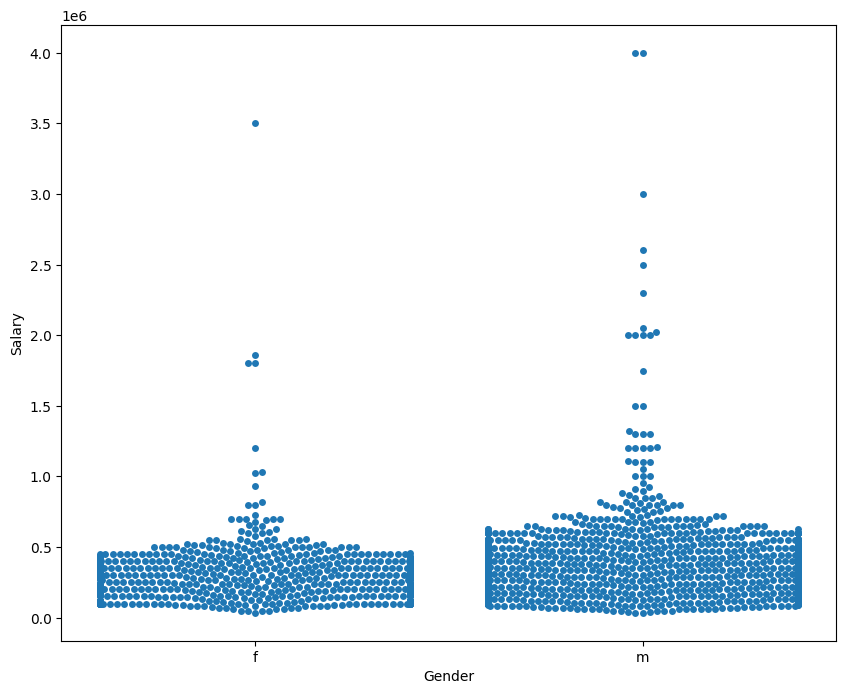

In [30]:
# Relationship between categorical and numerical columns

plt.figure(figsize=(10, 8))

# Swarm plot

sns.swarmplot(x='Gender', y='Salary', data=df)
plt.show()

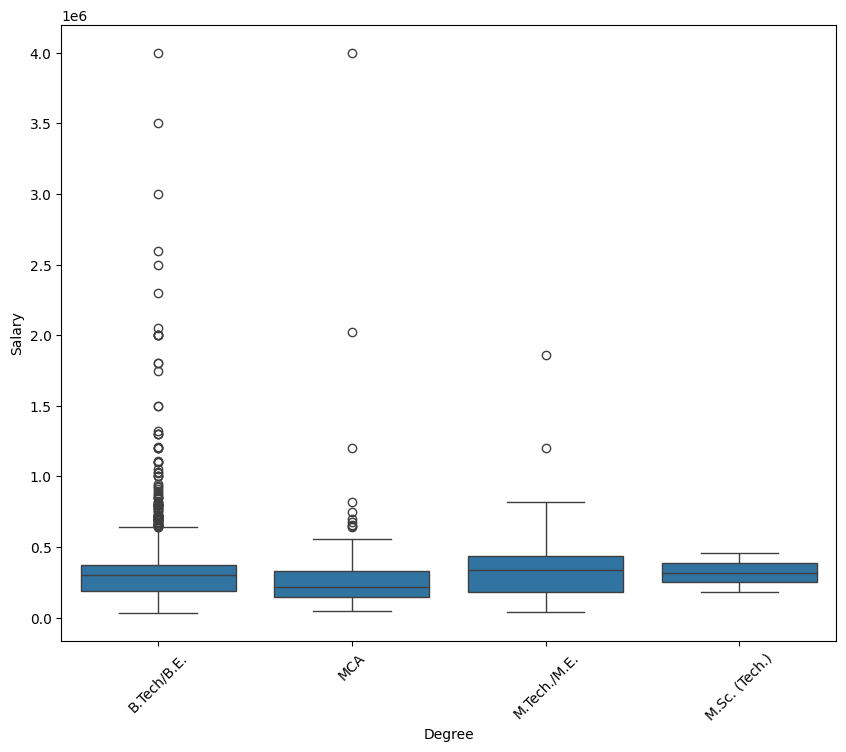

In [31]:
# Box plot

plt.figure(figsize=(10, 8))
sns.boxplot(x='Degree', y='Salary', data=df)
plt.xticks(rotation=45)
plt.show()

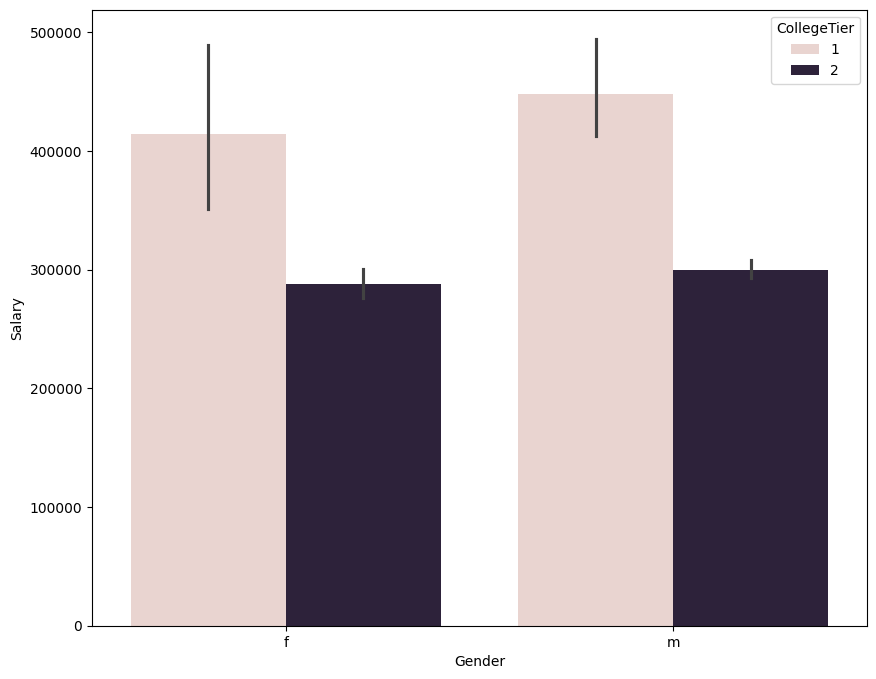

In [32]:
# Bar plot

plt.figure(figsize=(10, 8))
sns.barplot(x='Gender', y='Salary', hue='CollegeTier', data=df)
plt.show()

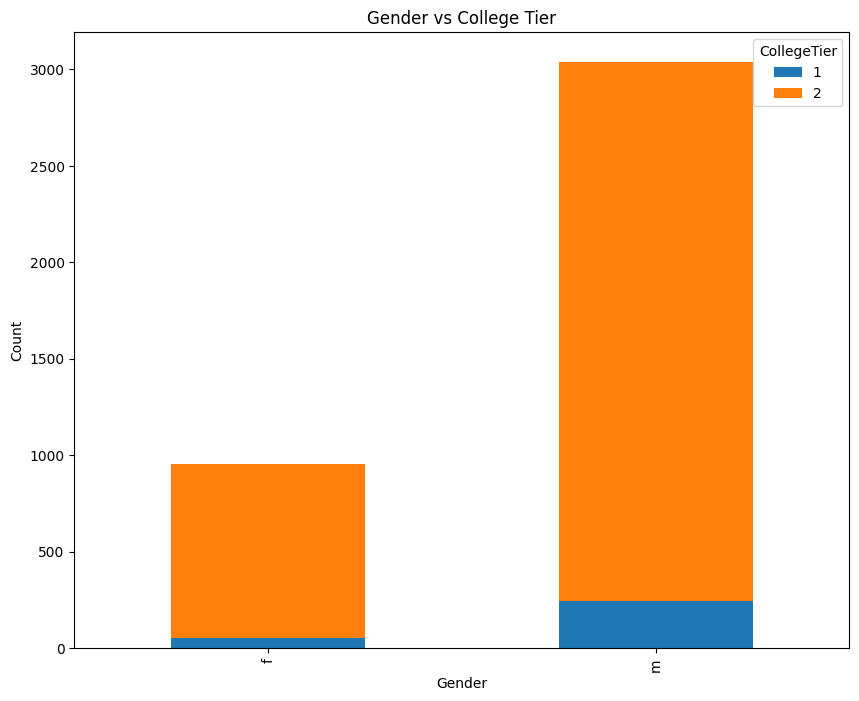

In [34]:
# Relationship between categorical columns
# Stacked bar plot

cross_tab = pd.crosstab(df['Gender'], df['CollegeTier'])
cross_tab.plot(kind='bar', stacked=True, figsize=(10, 8))
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Gender vs College Tier')
plt.show()

# Research Questions

In [36]:
# Research Question 1: Test the salary claim

# Filter data for Computer Science Engineering graduates
cse_data = df[df['Specialization'] == 'computer engineering']

# Extract data for specified job titles
specified_jobs = ['Programming Analyst', 'Software Engineer', 'Hardware Engineer', 'Associate Engineer']
specified_jobs_data = cse_data[cse_data['Designation'].isin(specified_jobs)]

# Calculate average salary for specified job titles
average_salary = specified_jobs_data['Salary'].mean()

# Test the claim
lower_bound = 2.5 * 10**5  # 2.5 lakhs
upper_bound = 3 * 10**5    # 3 lakhs
claim_test_result = lower_bound <= average_salary <= upper_bound

print("Average salary for specified job titles:", average_salary)
print("Does the data support the claim?", claim_test_result)

# Research Question 2: Relationship between gender and specialization

# Create a contingency table
contingency_table = pd.crosstab(df['Gender'], df['Specialization'])

# Perform chi-square test of independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

print("\nChi-square statistic:", chi2)
print("P-value:", p)

# Interpret the results
alpha = 0.05
if p < alpha:
    print("There is a significant relationship between gender and specialization.")
else:
    print("There is no significant relationship between gender and specialization.")


Average salary for specified job titles: nan
Does the data support the claim? False

Chi-square statistic: 104.46891913608455
P-value: 1.2453868176976918e-06
There is a significant relationship between gender and specialization.
